# Project GPU optimization

First import some libraries

In [ ]:
import numpy as np
import  matplotlib.pyplot as plt
from functools import wraps
import torch

Create a decorator for time measuring

In [ ]:
def timem(fn):
   from timeit import default_timer as ittimer
   @wraps(fn)
   def measure_time(*args, **kwargs):
      resultArray = np.array([])
      for _ in range(5):
         t1 = ittimer()
         result = fn(*args, **kwargs)
         t2 = ittimer()
         resultArray = np.append(resultArray,[t2-t1])
         print(f"@timefn: {fn.__name__} took {t2 - t1} seconds")
      avg = np.average(resultArray)
      print(f"Average: {avg}")
      std = np.std(resultArray)
      print(f"Standard deviation: {std}")
      return avg,std
   return measure_time

In [ ]:
@timem
def simulate_flocking(N, Nt, seed=17, params = {}):
    """Finite Volume simulation.

    Args:
        N (int): Number of birds simulated
        Nt (int): Simulation length, number of time steps
        Seed (int): Seed for the random numbers
        Params (dict): Optional dictionary containing specifications of parameters, like starting velocity, fluctuation etc
    """

    # Simulation parameters
    v0           = params.get('v0', 1.0)     # velocity
    eta          = params.get('eta', 0.5)    # random fluctuation in angle (in radians)
    L            = params.get('L', 10)       # size of box
    R            = params.get('R', 1)        # interaction radius
    dt           = params.get('dt', 0.2)     # time step
    plotRealTime = params.get('plotRealTime', False)     # Flag for updating the graph in real-time

    # Initialize
    np.random.seed(seed)      # set the random number generator seed

    # bird positions
    x = np.random.rand(N,1)*L
    y = np.random.rand(N,1)*L

    # bird velocities
    theta = 2 * np.pi * np.random.rand(N,1)
    vx = v0 * np.cos(theta)
    vy = v0 * np.sin(theta)

    # Prep figure
    if plotRealTime:
        fig = plt.figure(figsize=(4,4), dpi=80)
        ax = plt.gca()

    # Simulation Main Loop
    for i in range(Nt):

        # move
        x += vx*dt
        y += vy*dt

        # apply periodic BCs
        x = x % L
        y = y % L

        # find mean angle of neighbors within R
        mean_theta = theta
        for b in range(N):
            neighbors = (x-x[b])**2+(y-y[b])**2 < R**2
            sx = np.sum(np.cos(theta[neighbors]))
            sy = np.sum(np.sin(theta[neighbors]))
            mean_theta[b] = np.arctan2(sy, sx)

        # add random perturbations
        theta = mean_theta + eta*(np.random.rand(N,1)-0.5)

        # update velocities
        vx = v0 * np.cos(theta)
        vy = v0 * np.sin(theta)
        # plot in real time
        if plotRealTime: # or (i == Nt-1):
            plt.cla()
            plt.quiver(x,y,vx,vy)
            ax.set(xlim=(0, L), ylim=(0, L))
            ax.set_aspect('equal')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            plt.pause(0.001)

    # Save figure
    if plotRealTime:
        plt.savefig('simulation_plots/activematter.png',dpi=240)
        plt.show()
    return x, y

Execute it

@timefn: simulate_flocking took 2.5240192629999 seconds
@timefn: simulate_flocking took 2.4121157409999796 seconds
@timefn: simulate_flocking took 2.545526321999887 seconds
@timefn: simulate_flocking took 3.4001852050000707 seconds
@timefn: simulate_flocking took 2.48834613300005 seconds
Average: 2.6740385327999774
Standard deviation: 0.36589489621778165
@timefn: simulate_flocking took 6.301345279000088 seconds
@timefn: simulate_flocking took 7.087683183000081 seconds
@timefn: simulate_flocking took 6.433464030000096 seconds
@timefn: simulate_flocking took 6.990502563000064 seconds
@timefn: simulate_flocking took 7.088052423999898 seconds
Average: 6.780209495800046
Standard deviation: 0.34148905313631844
@timefn: simulate_flocking took 11.057950207999966 seconds
@timefn: simulate_flocking took 10.820342917000062 seconds
@timefn: simulate_flocking took 10.823350470999912 seconds
@timefn: simulate_flocking took 11.165821440999935 seconds
@timefn: simulate_flocking took 11.138668713000015

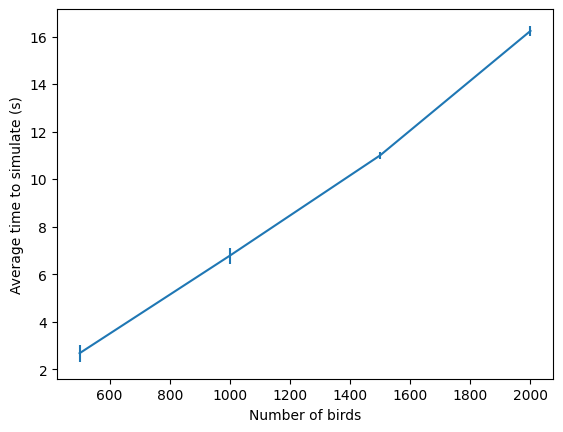

In [ ]:
sizes = [500, 1000, 1500, 2000]
Nt = 200
avgs = []
stds = []
for N in sizes:  # [500, 1000, 1500, 2000]:
    avg, std = simulate_flocking(N, Nt)
    avgs.append(avg)
    stds.append(std)
# plot
plt.errorbar(sizes, avgs, yerr=stds)
plt.xlabel("Number of birds")
plt.ylabel("Average time to simulate (s)")
plt.show()

In [ ]:
@timem
def simulate_flocking_torch(N, Nt, seed=17, params={}):
    """Finite Volume simulation.

    Args:
        N (int): Number of birds simulated
        Nt (int): Simulation length, number of time steps
        Seed (int): Seed for the random numbers
        Params (dict): Optional dictionary containing specifications of parameters, like starting velocity, fluctuation etc
    """

    # Simulation parameters
    v0 = params.get("v0", 1.0)  # velocity
    eta = params.get("eta", 0.5)  # random fluctuation in angle (in radians)
    L = params.get("L", 10)  # size of box
    R = params.get("R", 1)  # interaction radius
    dt = params.get("dt", 0.2)  # time step
    plotRealTime = params.get(
        "plotRealTime", False
    )  # Flag for updating the graph in real-time

    # Initialize
    torch.manual_seed(seed)  # set the random number generator seed

    # bird positions
    x = torch.rand(N, 1) * L
    y = torch.rand(N, 1) * L

    # bird velocities
    theta = 2 * torch.pi * torch.rand(N, 1)
    vx = v0 * torch.cos(theta)
    vy = v0 * torch.sin(theta)

    # Prep figure
    if plotRealTime:
        fig = plt.figure(figsize=(4, 4), dpi=80)
        ax = plt.gca()

    # Simulation Main Loop
    for i in range(Nt):

        # move
        x += vx * dt
        y += vy * dt

        # apply periodic BCs
        x = x % L
        y = y % L

        # find mean angle of neighbors within R
        mean_theta = theta
        # Calculate squared distances in one go
        distances = (x.unsqueeze(1) - x) ** 2 + (y.unsqueeze(1) - y) ** 2
        # Mask out non-neighbors using broadcasting
        neighbors = distances < R**2
        # Vectorized sum of cosine and sine using masked reduction
        sx = torch.sum(torch.cos(theta) * neighbors, dim=1)
        sy = torch.sum(torch.sin(theta) * neighbors, dim=1)
        # Calculate mean theta using safe division (avoiding potential divide by zero)
        mean_theta = torch.atan2(sy, sx + 1e-8)  # Add small epsilon for safety


                # add random perturbations
        theta = mean_theta + eta * (torch.rand(N, 1) - 0.5)

        # update velocities
        vx = v0 * torch.cos(theta)
        vy = v0 * torch.sin(theta)
        # plot in real time
        if plotRealTime:  # or (i == Nt-1):
            plt.cla()
            plt.quiver(x, y, vx, vy)
            ax.set(xlim=(0, L), ylim=(0, L))
            ax.set_aspect("equal")
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            plt.pause(0.001)

    # Save figure
    if plotRealTime:
        plt.savefig("simulation_plots/activematter.png", dpi=240)
        plt.show()
    return x, y


@timefn: simulate_flocking_torch took 1.1996031039998343 seconds
@timefn: simulate_flocking_torch took 0.9667217299997901 seconds
@timefn: simulate_flocking_torch took 0.4271496129999832 seconds
@timefn: simulate_flocking_torch took 0.35083201099996586 seconds
@timefn: simulate_flocking_torch took 0.3428049900001042 seconds
Average: 0.6574222895999355
Standard deviation: 0.3565482657545831
@timefn: simulate_flocking_torch took 1.8723060709999118 seconds
@timefn: simulate_flocking_torch took 1.9033158530000946 seconds
@timefn: simulate_flocking_torch took 1.5844716619999417 seconds
@timefn: simulate_flocking_torch took 1.4095904729999802 seconds
@timefn: simulate_flocking_torch took 1.5039242279999598 seconds
Average: 1.6547216573999777
Standard deviation: 0.19844710895369597
@timefn: simulate_flocking_torch took 3.7669289719999597 seconds
@timefn: simulate_flocking_torch took 4.174319598000011 seconds
@timefn: simulate_flocking_torch took 3.5159433860001172 seconds
@timefn: simulate_fl

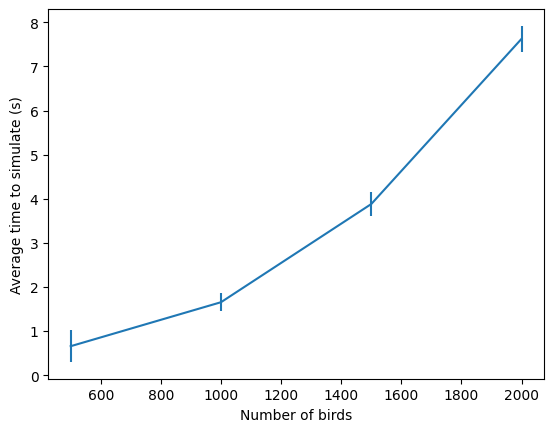

In [ ]:
sizes = [500, 1000, 1500, 2000]
Nt = 200
avgs = []
stds = []
for N in sizes:  # [500, 1000, 1500, 2000]:
    avg, std = simulate_flocking_torch(N, Nt)
    avgs.append(avg)
    stds.append(std)
# plot
plt.errorbar(sizes, avgs, yerr=stds)
plt.xlabel("Number of birds")
plt.ylabel("Average time to simulate (s)")
plt.show()

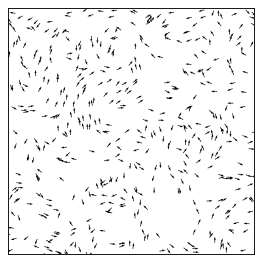

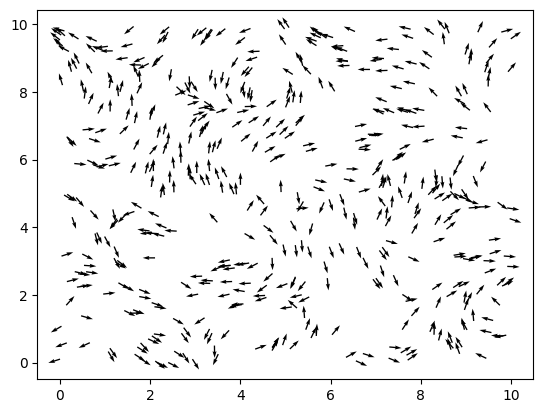

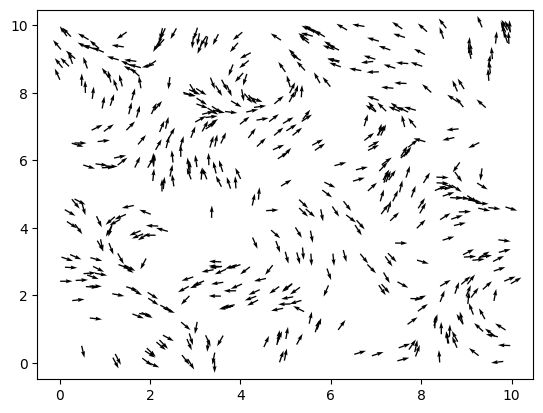

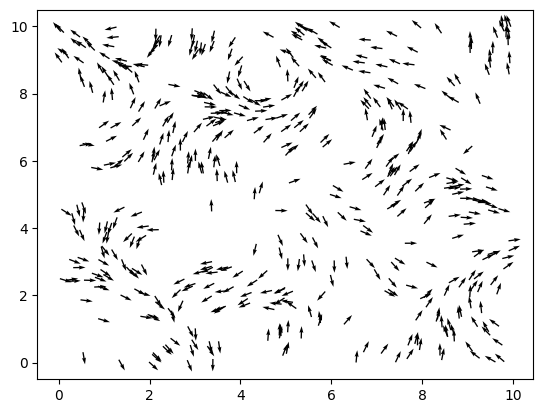

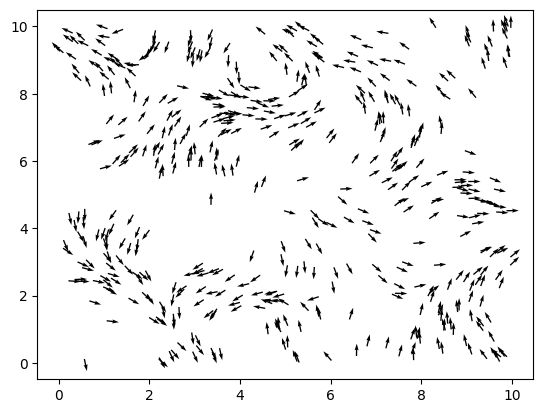

...

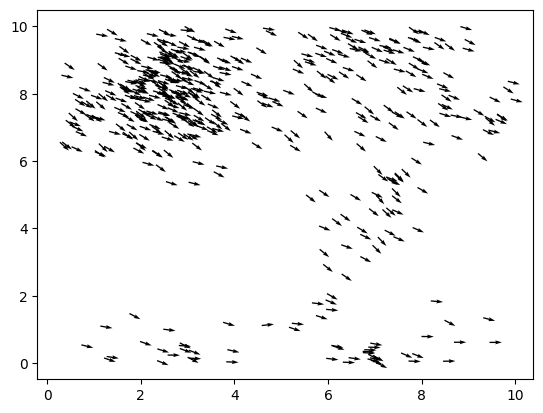

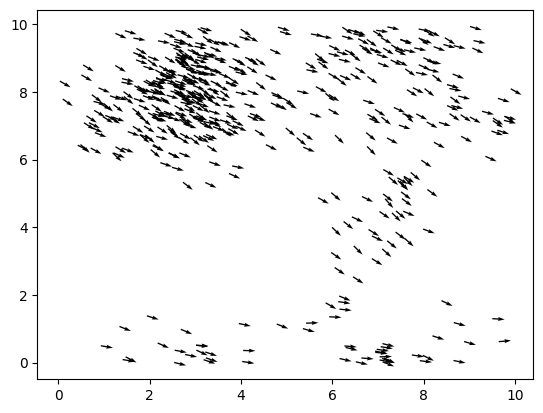

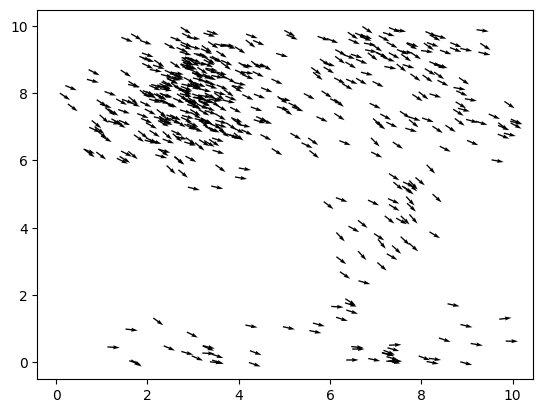

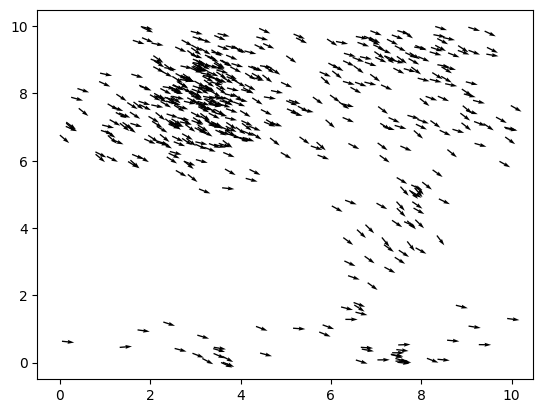

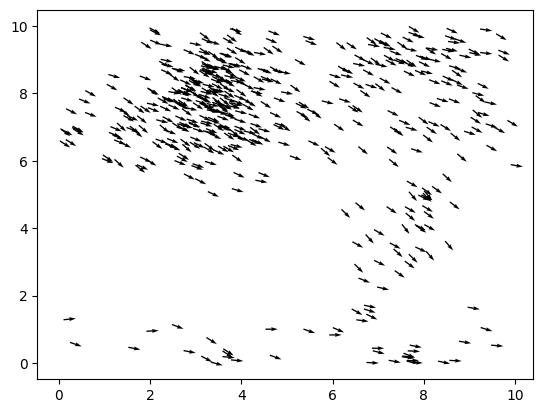

FileNotFoundError: [Errno 2] No such file or directory: 'simulation_plots/activematter.png'

<Figure size 640x480 with 0 Axes>

In [46]:
simulate_flocking_torch(500, 200,17,{"plotRealTime":True})